In [1]:
# Prerequisite Module
import numpy as np  
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import json
import warnings
warnings.filterwarnings("ignore")
pd.set_option("display.max_columns", None)

# **Bangkok Airbnb Listing Data Analysis**

*Oleh : Kirana Shely Sefiana*

### **1. Business Context**

#### 1.1 Storyline
Bangkok adalah salah satu kota yang ramai dikunjungi di Asia Tenggara. Setiap tahun nya kota ini dapat menarik jutaan wisatawan dari mancanegera. Di tengah lonjakan pariwisata, banyak calon investor, pemilik properti, dan penyedia akomodasi profesional yang melihat peluang keuntungan dari penyewaan properti di Kota Bangkok. Namun sebelum itu, calon investor dan pemilik properti ingin melakukan analisis terhadap *opportunity* penyewaan properti pada platform Airbnb.

#### 1.2 Problem Statement
Bagi calon penyewa, investor, dan calon host baru memiliki pertanyaan seperti,
- Area mana di Bangkok yang paling banyak menyediakan listing Airbnb?
- Berapa harga rata-rata per malam untuk berbagai jenis kamar?
- Seberapa sering properti dapat disewakan dalam setahun? Apakah akan menguntungkan?
- Siapa saja host yang memiliki banyak listing? Apakah mereka penyedia akomodasi profesional?
- Apakah lebih untung menyewakan jangka pendek atau jangka panjang?

#### 1.3 Key Objective
1. Menganalisis distribusi properti berdasarkan lokasi
2. Mengevaluasi strategi harga berdasarkan jenis kamar dan lokasi
3. Melihat ketersediaan unit sepanjang tahun, untuk melihat seberapa sering properti banyak disewakan dan bagaimana keuntungannya
4. Mengidentifikasi host dengan jumlah listing terbanyak, untuk melihat *market share*
5. Menganalisis durasi minimum pemesanan untuk melihat apakah listing lebih cocok untuk sewa jangka panjang atau pendek

### **2. Data Understanding**

In [2]:
# Proses Read Data
df = pd.read_csv("Airbnb Listings Bangkok.csv", index_col=0)

#### 2.1 Data Dictionary

In [3]:
# Mengecek list kolom data
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15854 entries, 0 to 15853
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              15854 non-null  int64  
 1   name                            15846 non-null  object 
 2   host_id                         15854 non-null  int64  
 3   host_name                       15853 non-null  object 
 4   neighbourhood                   15854 non-null  object 
 5   latitude                        15854 non-null  float64
 6   longitude                       15854 non-null  float64
 7   room_type                       15854 non-null  object 
 8   price                           15854 non-null  int64  
 9   minimum_nights                  15854 non-null  int64  
 10  number_of_reviews               15854 non-null  int64  
 11  last_review                     10064 non-null  object 
 12  reviews_per_month               10064

##### *Informasi Kolom*
| Kolom                           | Deskripsi                                                                                       |
|---------------------------------|-------------------------------------------------------------------------------------------------|
| id                              | Kode unik untuk setiap listing yang terdaftar                                                   |
| name                            | Nama dari listing yang terdaftar                                                                |
| host_id                         | Kode untuk untuk host atau pemilik listing                                                      |
| host_name                       | Nama dari host                                                                                  |
| neighborhood                    | Nama daerah letak listing berada                                                                |
| latitude, longitude             | Koordinat atau projeksi peta letak listing berada                                               |
| room_type                       | Tipe listing yang dapat berupa *Entire Place*, *Private Room*, *Hotel Room* atau *Shared Room*               |
| Price                           | Harga sewa listing perhari dalam mata uang *Baht*                                               |
| minimum_nights                  | Minimal hari penyewaan listing                                                                  |
| number_of_reviews               | Jumlah review yang diterima listing                                                             |
| last_review                     | Tanggal terakhir review yang diterima                                                           |
| calculated_host_listing_count   | Jumlah listing yang dimiliki host                                                               |
| availability_365                | Ketersediaan hari penyewaan listing dalam 365 hari                                              |
| number_of_reviews_ltm           | Jumlah review listing dalam 12 bulan atau 1 tahun terakhir                                      |



#### 2.2 Data Summary

In [4]:
row, column = df.shape
print(f"Keadaan data saat ini memiliki {row} baris dan {column} kolom")

Keadaan data saat ini memiliki 15854 baris dan 16 kolom


##### *Statistical Summary*

In [5]:
# Statistic Analysis untuk data tipe numerikal
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,1.585400e+04,1.585400e+04,15854.000000,15854.000000,1.585400e+04,15854.000000,15854.000000,10064.000000,15854.000000,15854.000000,15854.000000
mean,1.579397e+17,1.541058e+08,13.745144,100.559903,3.217704e+03,15.292355,16.654157,0.813145,13.889618,244.378643,3.481519
std,2.946015e+17,1.318726e+08,0.043040,0.050911,2.497212e+04,50.815020,40.613331,1.090196,30.269848,125.843224,8.916937
min,2.793400e+04,5.892000e+04,13.527300,100.329550,0.000000e+00,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000
25%,2.104509e+07,3.974431e+07,13.720090,100.529690,9.000000e+02,1.000000,0.000000,0.120000,1.000000,138.000000,0.000000
50%,3.503734e+07,1.224556e+08,13.738490,100.561415,1.429000e+03,1.000000,2.000000,0.435000,4.000000,309.000000,0.000000
75%,5.256154e+07,2.390547e+08,13.759497,100.585150,2.429000e+03,7.000000,13.000000,1.060000,13.000000,360.000000,3.000000
max,7.908162e+17,4.926659e+08,13.953540,100.923440,1.100000e+06,1125.000000,1224.000000,19.130000,228.000000,365.000000,325.000000


In [6]:
# Statistic Analysis untuk data tipe kategori
df.describe(include="object")

,name,host_name,neighbourhood,room_type,last_review
count,15846,15853,15854,15854,10064
unique,14794,5312,50,4,1669
top,New! La Chada Night Market studio 2PPL near MRT,Curry,Vadhana,Entire home/apt,2022-12-11
freq,45,228,2153,8912,189


##### **Key Findings**
Secara sekilas, didapatkan informasi sebagai berikut :
- Rata-rata harga penginapan di Bangkok sekitar 3.220 Baht per-malam, namun median nya 1.429 Baht
- Terdapat harga penginapan sebesar 0 Baht permalam
- Terdapat value *minimum_nights* sebesar 1125 hari yang artinya melebihi 365 hari
- Terdapat banyak host yang memiliki lebih dari satu listing
- Host bernama "Curry" memiliki listing properti terbanyak
- Daerah "Vadhana" menjadi tempat paling banyak memiliki listing
- Tipe listing *Entire Home/apt* menjadi tipe listing paling banyak

Informasi ini akan menjadi dasar untuk proses data cleaning dan analysis

### **3. Data Cleaning**

#### 3.1 Missing Values

In [7]:
df.isna().sum()

id                                   0
name                                 8
host_id                              0
host_name                            1
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       5790
reviews_per_month                 5790
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
dtype: int64

In [8]:
# Persentase missing value
df[["name", "host_name", "last_review", "reviews_per_month"]].isna().sum() / len(df) * 100

name                  0.050460
host_name             0.006308
last_review          36.520752
reviews_per_month    36.520752
dtype: float64

Berdasarkan persentase missing value, kolom *name* dan *host_name* memiliki data kosong yang sangat sedikit (kurang dari 0.1%). Lalu pada kolom *last_review* dan *reviews_per_month* memiliki 36.5% kekosongan data.

In [9]:
# Pengecekan missing value pada kolom last_review dan reviews_per_month
df[df["last_review"].isna() | df["reviews_per_month"].isna()].head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0
7,1738669,1 chic bedroom apartment in BKK,7045870,Jiraporn,Chatu Chak,13.82925,100.56737,Entire home/apt,1461,1,0,NaN,NaN,1,365,0
14,959254,"Deluxe Condo, Nana, Pool/GYM/Sauna",5153476,Natcha,Khlong Toei,13.71516,100.56806,Entire home/apt,1400,30,0,NaN,NaN,1,365,0


Dari hasil pengecekan, baris data dengan missing value pada kolom last_review dan reviews_per_month terjadi karena memang review pada listing tersebut masih nol atau belum ada review. Dapat diasumsikan bahwa listing yang belum memiliki review merupakan properti yang baru saja mulai disewakan.

#### *Handling Process*
- Baris dengan data kosong pada kolom *name* dan *host_name* dapat dihapus karena persentase data kosong yang sedikit sehingga tidak terlalu berpengaruh pada informasi data secara keseluruhan.
- Baris dengan data kosong pada kolom *last_review* dan *reviews_per_month* akan dilakukan imputasi dengan value **NaT (Not a Time)** dan **0**, mengingat data ini memang kosong karena belum ada review yang didapatkan pada listing ini.

In [10]:
# Proses hapus missing value pada kolom name dan host_name
df.dropna(subset=['name', 'host_name'], inplace=True)

In [11]:
# Dari sebelumnya yang terdiri dari 15854 row berkurang sebanyak 9 row menjadi 15845
df.shape[0]

15845

In [12]:
# Proses imputasi kolom last_review
df["last_review"] = pd.to_datetime(df["last_review"], errors="coerce")

In [13]:
# Proses imputasi kolom reviews_per_month
df["reviews_per_month"] = df["reviews_per_month"].fillna(0)

##### *Missing value evaluation after handling*

In [14]:
# Pengecekan akhir missing value
df.isna().sum()

id                                   0
name                                 0
host_id                              0
host_name                            0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       5784
reviews_per_month                    0
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
dtype: int64

Catatan : 

kolom **last_review** tetap memiliki nilai kosong karena value nya memang belum ada sehingga dituliskan sebagai Not a Time (NaT) yang berarti jenis None untuk tipe *datetime*.

#### 3.2 Duplicated Values

In [15]:
# Pengecekan duplikat setiap row data
df.duplicated().sum()

np.int64(0)

Berdasarkan hasil pengecekan, tidak ada barisan data yang terduplikat. Selanjutnya akan dilakukan pengecekan duplikat untuk kolom-kolom yang tidak boleh memiliki dua nilai yang sama yaitu **id** listing. Untuk kolom *host_id* pasti akan memiliki duplikat karena dalam data ini ada beberapa host yang memiliki properti lebih dari satu.

In [16]:
# Pengecekan duplikat untuk kolom id
df["id"].duplicated().sum()

np.int64(0)

In [17]:
df["host_id"].duplicated().sum()

# Pasti akan ada host_id yang sama karena beberapa host memiliki listing lebih dari satu.

np.int64(9194)

#### *Duplicated Values Evaluation*
Dari hasil pengecekan, tidak ada row data yang duplikat. Untuk kolom "id" yang harus unik juga tidak terdapat duplikat.

#### 3.3 Checking Anomalies and Errors

In [18]:
# Pengecekan kolom kategori listing / room_type
df["room_type"].value_counts()

room_type
Entire home/apt    8911
Private room       5762
Hotel room          649
Shared room         523
Name: count, dtype: int64

Dari hasil pengecekan, tipe kategori yang ada dalam row data sudah valid sesuai dengan kategori yang ada.

In [19]:
# Pengecekan anomali harga penginapan / price
df[df["price"] <= 0]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
11103,44563108,Somerset Maison Asoke Bangkok,360620448,Somerset Maison Asoke,Vadhana,13.73815,100.5642,Hotel room,0,1,0,NaT,0.0,1,0,0


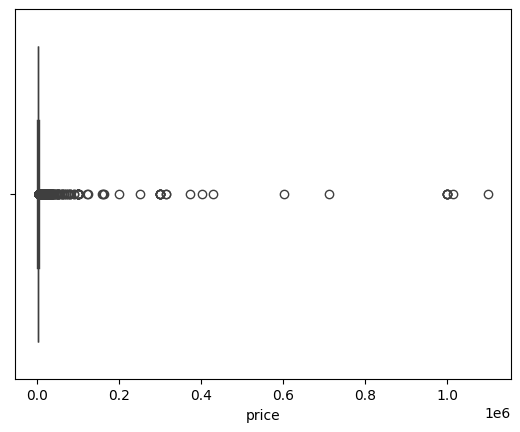

In [20]:
# Melihat persebaran data price
sns.boxplot(data=df, x="price")
plt.show()

In [21]:
# Median dan rata2 pada data harga dengan distribusi ekstrim
display(df["price"].median(), df["price"].mean())

np.float64(1429.0)

np.float64(3218.5796781319027)

Berdasarkan hasil pengecekan anomali pada kolom price, ditemukan :
1. Price/harga sewa listing *0 Baht* : tidak masuk akal, karena tidak mungkin penyewaan gratis
2. Terdapat persebaran harga yang ekstrim terutama yang memiliki harga diatas mayoritas harga. Diasumsikan terdapat properti mewah yang disewakan dengan harga tinggi

Untuk mengatasi anomali di pada kolom price ini akan dilakukan penghapusan pada data dengan price sebesar *0 Baht*. Lalu untuk persebaran data yang ekstrim kedepannya dapat dilakukan pembatasan range harga saat melakukan analisis.

In [22]:
# Penghapusan data dengan price = 0
df = df.drop(df[df["price"] == 0].index)

In [23]:
# Membuat filter untuk harga yang tinggi
# Mencari batas atas dari harga sewa
q1 = df["price"].quantile(0.25)
q3 = df["price"].quantile(0.75)
iqr = q3 - q1
upper_bound = q3 + 1.5 * iqr
upper_bound

np.float64(4725.625)

In [24]:
# banyak data yang ada di atas outlier
len(df[df["price"] > upper_bound]) / len(df) * 100

8.842464024236305

Telah diketahui bahwa persebaran harga sewa sangat ekstrim karena diasumsikan bahwa terdapat beberapa properti listing mewah yang disewakan dengan harga tinggi. Pada analisis ini, diasumsikan bahwa *stakeholder* yang berencana investasi pada **properti listing untuk segmen general**, tidak pada segmen properti mewah. Maka dari itu, pada analisis ini harga akan dibatasi dengan mengkonsiderasi nilai batasannya berdasarkan nilai batas atas (*upper bound*) dari harga sewa.

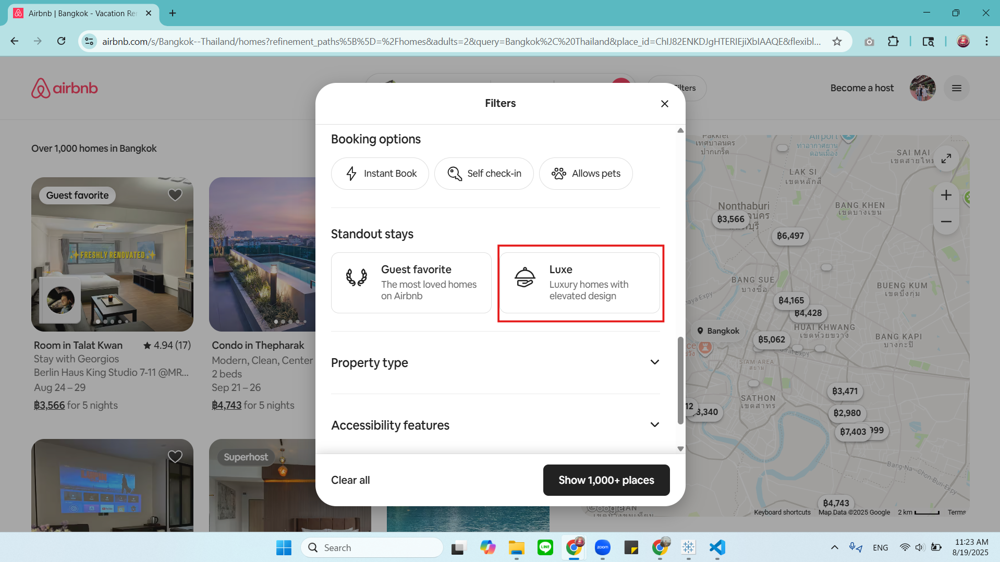

Hal ini juga didukung dengan informasi bahwa pada aplikasi Airbnb memang terdapat pilihan properti yang termasuk *luxury* sehingga dapat diasumsikan bahwa properti dengan harga yang tinggi secara ekstrim termasuk kategori *luxury*.

In [25]:
# Mencari persentase data yang harga nya di atas 5 ribu BHT
len(df[df["price"] <= 5000]) / len(df) * 100

92.51451653622823

Didapatkan bahwa batas atas harga sewa berada di angka 4.725 BHT. Dengan mengkonsiderasi banyaknya data listing dengan harga di bawah 5.000 BHT sebesar 93%, maka akan diambil pembatasan harga sewa untuk analisis hingga **rentang harga 5.000 BHT** dengan asumsi harga tersebut adalah **batas maksimal** properti listing **segmen general** (segmen yang tidak termasuk properti mewah).

In [26]:
# kedepannya akan menggunakan df_filtered yang memiliki data harga terfilter
df_filtered = df[df["price"] <= 5000]

In [27]:
# Pengecekan kolom availability_365
df_filtered[df_filtered["availability_365"] <= 0]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
51,1019241,Chic two bedroom for Monthly rental,3323622,Phoebe,Bang Rak,13.726870,100.527250,Entire home/apt,2701,30,104,2020-02-20,0.89,1,0,0
61,1041976,Long-stay special rate spacious entire floor Siam,5735895,Pariya,Parthum Wan,13.748140,100.520160,Entire home/apt,2900,1125,295,2021-08-21,2.61,3,0,0
104,527553,"Beautiful Apt @ Ratchayothin BTS, Free Wifi",2592798,Nokina,Chatu Chak,13.828410,100.571030,Entire home/apt,1004,2,24,2018-07-22,0.19,2,0,0
141,1244333,"Private Room@Chatuchak,BTS,JJ market,DMK airport",2087671,Apipu,Phaya Thai,13.792210,100.546310,Private room,399,1,33,2020-03-15,0.78,1,0,0
152,1316688,Contemporary Modern Duplex - Thonglor,5394070,Eva,Khlong Toei,13.722420,100.579620,Entire home/apt,1489,30,81,2022-10-07,0.72,1,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15431,779396995711655318,The Inspired Luxury: 1BR/MRT/Pool/JODD Fair,133082557,Jean,Huai Khwang,13.753800,100.574680,Entire home/apt,1400,2,0,NaT,0.00,19,0,0
15433,779434871544801466,The Grand Luxury Suite:2BR 2WC /High Floor/Net...,133082557,Jean,Huai Khwang,13.759550,100.569950,Entire home/apt,3000,1,0,NaT,0.00,19,0,0
15438,779503507904940932,Cosy Room near MBK Siam Paragon,214984794,Sita,Parthum Wan,13.741934,100.524283,Private room,1879,1,0,NaT,0.00,10,0,0
15498,780301430602562032,Chill Out With Love :1BR WIFI/JOOD Fair/Pool,132745392,Mt,Huai Khwang,13.753780,100.574480,Entire home/apt,1000,2,0,NaT,0.00,25,0,0


Dari hasil pengecekan, terdapat kolom *availability_365* dengan value 0. Diasumsikan bahwa hal ini terjadi karena properti listing ini sudah penuh untuk disewakan sepanjang tahun.

In [28]:
# Pengecekan kolom minimum_nights
len(df_filtered[df_filtered["minimum_nights"] > 365])

10

Terdapat row data yang memiliki minimum_nights lebih dari 365. Diasumsikan hal ini terjadi karena sistem Airbnb tidak memberikan batasan hari maksimal penyewaan. Untuk mengatasinya, semua data dengan minimum_nights diatas 365 akan diubah menjadi 365 hari saja. Hal ini disebabkan pada kolom *availability_365* menunjukan hari yang bisa disewakan dalam satu tahun dengan nilai maksimum 365 hari sehingga tidak masuk akal jika jumlah minimum_nights lebih tinggi dari kolom *availability_365*.

In [29]:
# Proses ubah nilai minimum_nights yang melebihi batas
df_filtered["minimum_nights"] = df_filtered["minimum_nights"].apply(lambda x: 365 if x > 365 else x)

#### *Anomalies & Errors Values Evaluation*
Dilakukan pengecekan value tiap kolom yang perlu dipastikan nilainya masuk akal sesuai makna kolom. Dari pengecekan ditemukan beberapa anomali dan error value sebagai berikut :
1. Value kolom price = 0 -> hanya ada satu row dengan data seperti ini sehingga baris ini di-drop
2. Value kolom price di-filter dengan batasan price <= 5 ribu BHT
3. Value kolom minimum_nights > 365 hari -> terdapat 10 row data seperti ini sehingga dilakukan pengubahan value menjadi 365

Pada kolom-kolom lain telah dilakukan pengecekan kesesuaian value dengan makna kolom dan telah dipastikan sudah sesuai.

#### 3.4 Data Preparation
Sebelum memasuki langkah selanjutnya, akan dilakukan persiapan data supaya proses analisis dapat dilakukan dengan lebih mudah.

1. Akan dibuat kolom baru yaitu *booked_365* yang menunjukan berapa banyak properti listing sudah disewa dalam satu tahun. Kolom ini didapatkan berdasarkan **365 Hari - *availability_365***.
2. Akan dilakukan perubahan pada nama kolom "id" menjadi "listing_id" supaya makna kolom tampak lebih jelas.

In [30]:
# Penambahan kolom booked_365
df_filtered["booked_365"] = 365 - df_filtered["availability_365"]
df_filtered.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,booked_365
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0,12
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaT,0.00,2,358,0,7
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaT,0.00,1,365,0,0
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1,42
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaT,0.00,3,365,0,0


In [31]:
# Perubahan nama kolom "id"
df_filtered.rename(columns={"id":"listing_id"}, inplace=True)
df_filtered.head()

,listing_id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,booked_365
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0,12
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaT,0.00,2,358,0,7
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaT,0.00,1,365,0,0
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1,42
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaT,0.00,3,365,0,0


#### *Data Cleaning Evaluation*
Dari proses data handling dan cleaning di atas, didapatkan hasil data yang sudah bersih seperti di bawah ini.

In [32]:
# List kolom yang akan dipakai untuk evaluasi
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14658 entries, 0 to 15853
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   listing_id                      14658 non-null  int64         
 1   name                            14658 non-null  object        
 2   host_id                         14658 non-null  int64         
 3   host_name                       14658 non-null  object        
 4   neighbourhood                   14658 non-null  object        
 5   latitude                        14658 non-null  float64       
 6   longitude                       14658 non-null  float64       
 7   room_type                       14658 non-null  object        
 8   price                           14658 non-null  int64         
 9   minimum_nights                  14658 non-null  int64         
 10  number_of_reviews               14658 non-null  int64         
 11  last_re

### **4. Data Analysis**

#### 4.1 Analisis distribusi lokasi properti listing

In [33]:
# Menghitung distribusi lokasi properti
listing_counts = df_filtered.groupby('neighbourhood').size().reset_index(name='count')

# Melihat 10 lokasi dengan properti listing terbanyak
listing_counts.sort_values("count", ascending=False).head(10)

,neighbourhood,count
22,Khlong Toei,1917
47,Vadhana,1828
37,Ratchathewi,1067
18,Huai Khwang,1043
41,Sathon,767
8,Bang Rak,761
33,Phra Nakhon,595
32,Phra Khanong,541
13,Chatu Chak,527
6,Bang Na,431


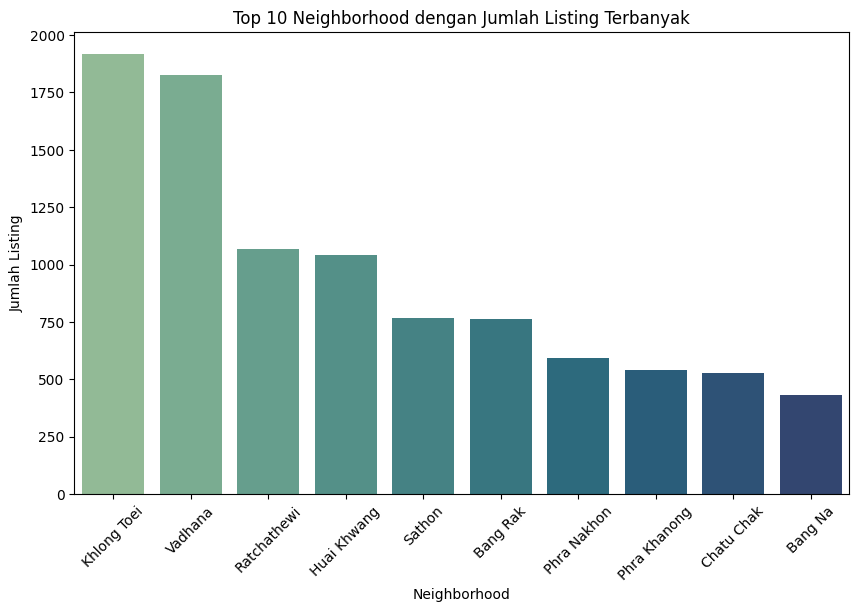

In [34]:
top10 = listing_counts.sort_values("count", ascending=False).head(10)

plt.figure(figsize=(10,6))
sns.barplot(
    data=top10,
    x="neighbourhood",
    y="count",
    palette="crest"
)
plt.title("Top 10 Neighborhood dengan Jumlah Listing Terbanyak")
plt.xlabel("Neighborhood")
plt.ylabel("Jumlah Listing")
plt.xticks(rotation=45)
plt.show()

In [35]:
# Membuat visualisasi map untuk melihat distribusi lokasi listing

# Menggunakan geojson Kota Bangkok sebagai pemetaan
geojson_file = "Bangkok-districts.geojson" 
with open(geojson_file, encoding='utf-8') as f:
    geojson_data = json.load(f)

# Titik tengah peta
center_lat = df_filtered['latitude'].mean()
center_lon = df_filtered['longitude'].mean()
m = folium.Map(location=[center_lat, center_lon], zoom_start=11)

# Buat Choropleth
folium.Choropleth(
    geo_data=geojson_data,
    name='choropleth',
    data=listing_counts,
    columns=['neighbourhood', 'count'],
    key_on='feature.properties.dname_e',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Jumlah Listing Airbnb'
).add_to(m)

folium.GeoJson(
    geojson_data,
    name="Neighborhood Labels",
    tooltip=folium.features.GeoJsonTooltip(
        fields=["dname_e"],  # kolom dari geojson
        aliases=["Neighborhood:"],
        localize=True
    )
).add_to(m)

folium.LayerControl().add_to(m)

m

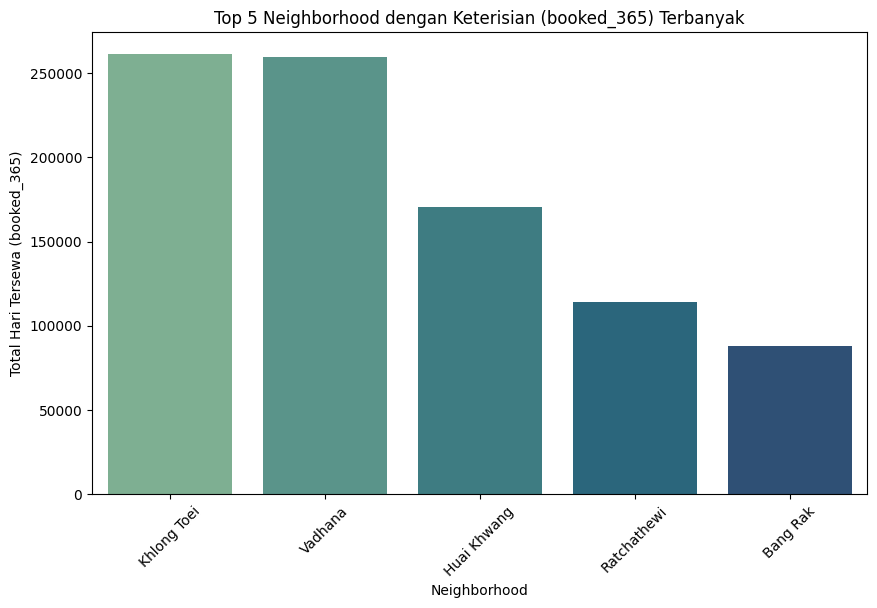

In [36]:
# Hitung total booked_365 per neighbourhood
neighbourhood_bookings = df_filtered.groupby("neighbourhood")["booked_365"].sum().reset_index()

# Ambil 5 neighborhood dengan total booking terbanyak
top5_bookings = neighbourhood_bookings.sort_values("booked_365", ascending=False).head(5)

# Visualisasi
plt.figure(figsize=(10,6))
sns.barplot(
    data=top5_bookings,
    x="neighbourhood",
    y="booked_365",
    palette="crest"
)
plt.title("Top 5 Neighborhood dengan Keterisian (booked_365) Terbanyak")
plt.xlabel("Neighborhood")
plt.ylabel("Total Hari Tersewa (booked_365)")
plt.xticks(rotation=45)
plt.show()

**Insight :**

Dari hasil analisis di atas, didapatkan bahwa dari sekian banyak daerah di Bangkok, **Khlong Toei** dan **Vadhana** merupakan daerah yang paling banyak memiliki properti listing dan juga paling sering disewa. Dapat diasumsikan bahwa kedua daerah ini dekat dengan lokasi wisata atau pusat perbelanjaan yang ada di Bangkok.

#### 4.2 Analisis harga sewa berdasarkan jenis dan lokasi

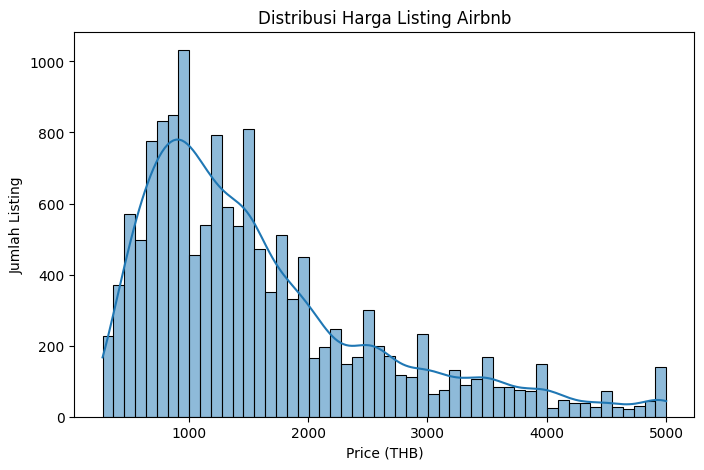

In [37]:
# Pengecekan distribusi harga sewa dengan batasan harga
plt.figure(figsize=(8,5))
sns.histplot(df_filtered["price"], kde=True)
plt.title("Distribusi Harga Listing Airbnb")
plt.xlabel("Price (THB)")
plt.ylabel("Jumlah Listing")
plt.show()

In [66]:
df_filtered["price"].skew()

np.float64(1.2699581339417945)

In [67]:
df_filtered["price"].kurtosis() + 3

np.float64(4.172782998070924)

In [72]:
# Median pada data harga dengan distribusi harga yang telah difilter
display(df_filtered["price"].median(), df_filtered["price"].mean(), df_filtered["price"].mode()[0])

np.float64(1327.0)

np.float64(1613.5322690680857)

np.int64(1500)

Berdasarkan analisis pada distribusi harga, dapat dikatakan bahwa harga memiliki distribusi tidak normal. Hal ini dikarenakan dari persebaran pda histogram kolom *price* terlihat memiliki ekor ke kanan. Lalu nilai skewness dari data ini lebih dari nol dan nilai kurtosis nya lebih dari 3 sehingga dapat dikatakan distribusi harga tidak normal. Oleh karena itu, akan digunakan median untuk analisis yang berhubungan dengan *price*.

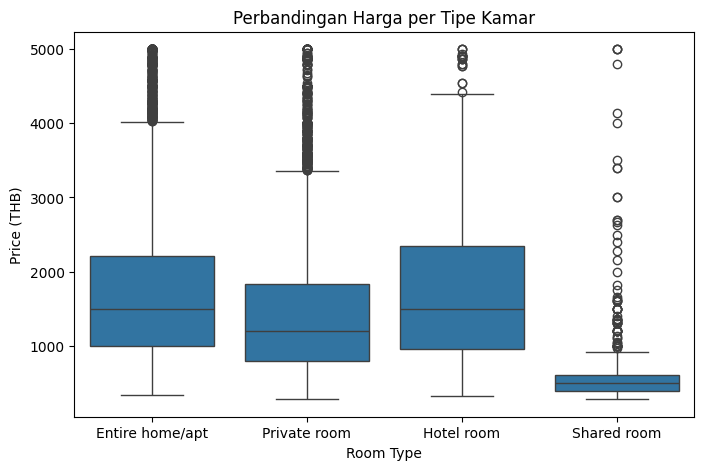

In [39]:
# Analisis harga sewa berdasarkan jenis
plt.figure(figsize=(8,5))
sns.boxplot(data=df_filtered, x='room_type', y='price')
plt.title("Perbandingan Harga per Tipe Kamar")
plt.xlabel("Room Type")
plt.ylabel("Price (THB)")
plt.show()

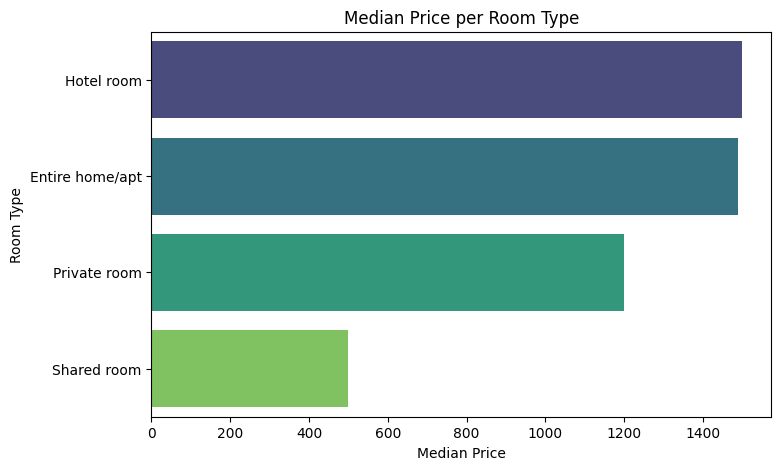

In [40]:
# Mencari median harga untuk tiap tipe properti
order = df_filtered.groupby("room_type")["price"].median().sort_values(ascending=False).index

plt.figure(figsize=(8,5))
sns.barplot(
    data=df_filtered,
    x="price",
    y="room_type",
    estimator="median",
    order=order,       # kasih urutan berdasarkan median terbesar
    palette="viridis",
    ci=None
)
plt.title("Median Price per Room Type")
plt.xlabel("Median Price")
plt.ylabel("Room Type")
plt.show()

In [41]:
# Hitung rata-rata harga per neighbourhood
price_per_neighbourhood = (
    df_filtered.groupby('neighbourhood')['price']
      .median()   # menggunakan median karena distribusi tidak normal
      .reset_index()
)
price_per_neighbourhood.sort_values("price", ascending=False).head(5)

,neighbourhood,price
29,Parthum Wan,2000.0
8,Bang Rak,1790.0
47,Vadhana,1760.0
39,Samphanthawong,1732.0
22,Khlong Toei,1582.0


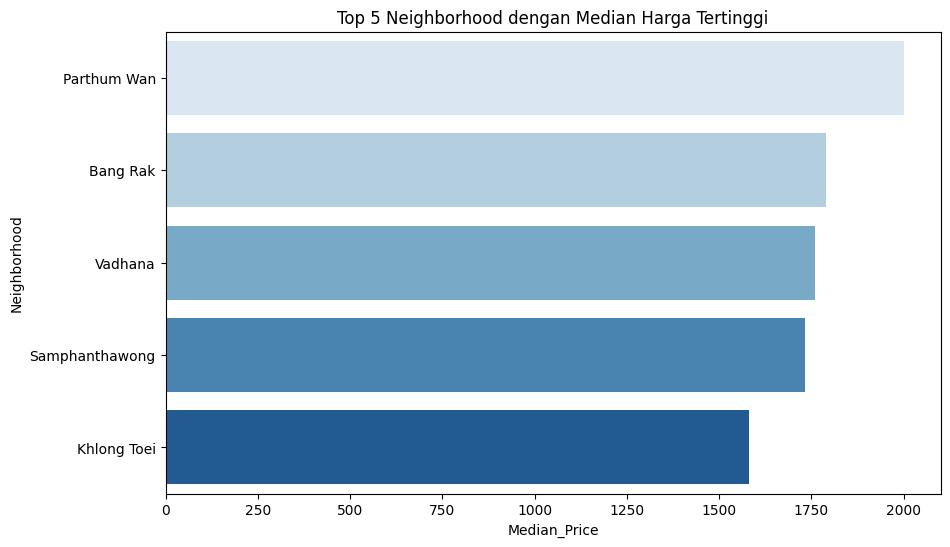

In [42]:
# Menampilkan 5 daerah dengan median harga sewa properti tertinggi
top5 = price_per_neighbourhood.sort_values("price", ascending=False).head(5)

plt.figure(figsize=(10,6))
sns.barplot(
    data=top5,
    x="price",
    y="neighbourhood",
    palette="Blues"
)
plt.title("Top 5 Neighborhood dengan Median Harga Tertinggi")
plt.xlabel("Median_Price")
plt.ylabel("Neighborhood")
plt.show()

In [43]:
# Titik tengah peta
center_lat = df_filtered['latitude'].mean()
center_lon = df_filtered['longitude'].mean()
m = folium.Map(location=[center_lat, center_lon], zoom_start=11)

# Buat choropleth harga
folium.Choropleth(
    geo_data=geojson_data,
    name='choropleth_price',
    data=price_per_neighbourhood,
    columns=['neighbourhood', 'price'],
    key_on='feature.properties.dname_e',  # sesuaikan field di geojson
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Median Harga Sewa Airbnb'
).add_to(m)

# Tambahkan label nama wilayah + median harga
folium.GeoJson(
    geojson_data,
    name="Neighborhood Labels",
    tooltip=folium.features.GeoJsonTooltip(
        fields=["dname_e"],  
        aliases=["Neighborhood:"],
        localize=True,
        labels=True,
        sticky=True
    )
).add_to(m)

folium.LayerControl().add_to(m)

# Tampilkan map
m

**Insight :**

- Dalam batasan harga maksimal 5 ribu Baht, tipe properti yang *Shared Room* memiliki nilai tengah harga sewa terendah dengan kisaran harga 500 Baht. Sedangkan untuk tipe *Private Room* memiliki kisaran harga 1200 Baht. Lalu untuk tipe *Hotel Room* dan *Entire Home/Apt* memiliki rata-rata harga di kisaran 1.500 Baht.

- Berdasarkan lokasi, daerah dengan nilai tengah harga tertinggi terdapat pada daerah **Parthum Wan** dan **Bang Rak**. Kedua lokasi ini masih dekat dengan daerah pariwisata dan pusat perbelanjaan. Dapat diasumsikan juga bahwa daerah ini merupakan tempat dengan banyak properti elit.

#### 4.3 Analisis keuntungan dan frekuensi penyewaan per-Tahun

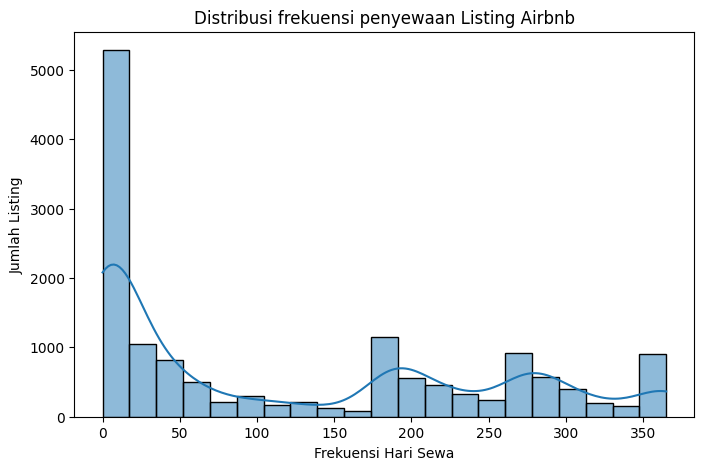

In [44]:
# Melihat distribusi frekuensi hari penyewaan properti
plt.figure(figsize=(8,5))
sns.histplot(df_filtered['booked_365'], kde=True)
plt.title("Distribusi frekuensi penyewaan Listing Airbnb")
plt.xlabel("Frekuensi Hari Sewa")
plt.ylabel("Jumlah Listing")
plt.show()

Pada visualisasi distribusi penyewaan properti, dapat dilihat bahwa persebaran datanya tidak normal karena memiliki ekor panjang ke kanan (right skewed)

In [45]:
# Median frekuensi sewa
df_filtered["booked_365"].median()

np.float64(59.0)

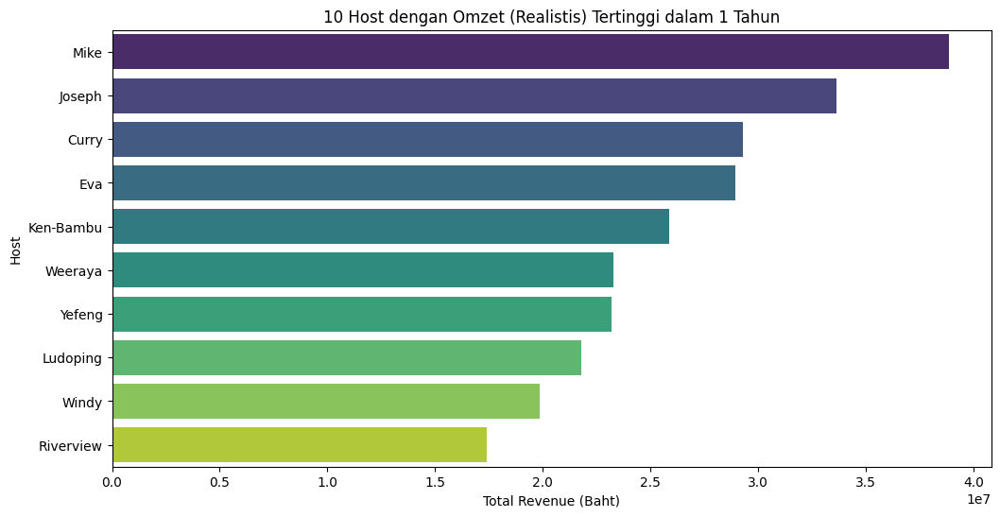

In [ ]:
# Revenue (asumsi 1 hari booking mengurangi 1 hari pada kolom availability)
df_filtered['revenue'] = df_filtered['price'] * df_filtered['booked_365']

# Top 10 host dengan omzet realistis (price <= 5000) tertinggi
top_hosts = (
    df_filtered.groupby('host_name')['revenue']
      .sum()
      .sort_values(ascending=False)
      .head(10)
)

plt.figure(figsize=(12,6))
sns.barplot(x=top_hosts.values, y=top_hosts.index, palette="viridis")
plt.title("10 Host dengan Omzet Tertinggi dalam 1 Tahun")
plt.xlabel("Total Revenue (Baht)")
plt.ylabel("Host")
plt.show()


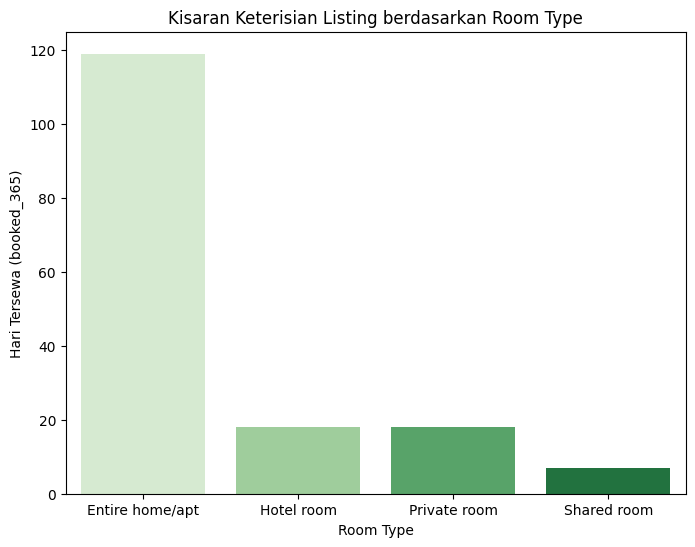

In [47]:
#Kisaran booked_365 per room_type 
room_avg = df_filtered.groupby("room_type")["booked_365"].median().reset_index()

plt.figure(figsize=(8,6))
sns.barplot(
    data=room_avg,
    x="room_type",
    y="booked_365",
    palette="Greens"
)
plt.title("Kisaran Keterisian Listing berdasarkan Room Type")
plt.xlabel("Room Type")
plt.ylabel("Hari Tersewa (booked_365)")
plt.show()

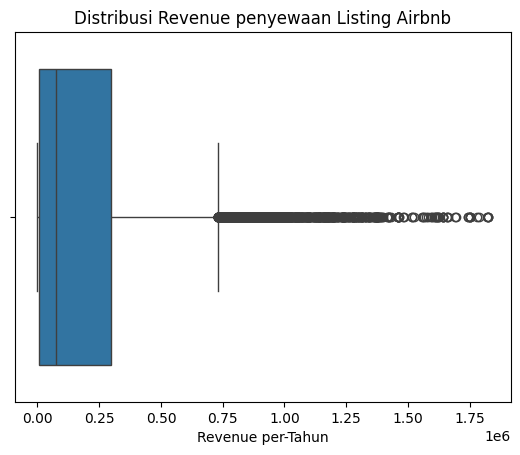

In [48]:
# melihat persebaran revenue / omzet
sns.boxplot(data=df_filtered, x="revenue")
plt.title("Distribusi Revenue penyewaan Listing Airbnb")
plt.xlabel("Revenue per-Tahun")
plt.show()

Dari visualisasi boxplot, kolom revenue memiliki distribusi data yang tidak normal dengan ditandainya banyak outlier di sebelah kanan.

In [49]:
df_filtered["revenue"].median()

np.float64(76000.0)

**Insight :**

- Ditemukan dari kolom *booked_365* bahwa dalam setahun bisa didapatkan penyewaan listing dengan kisaran 59 hari dalam satu tahun.

- Dari 4 jenis tipe room listing, tipe *Entire Home/Apt* merupakan yang paling sering disewakan.

- Dengan asumsi bahwa kolom *price* merupakan omzet dari penyewaan per-malam, didapatkan bahwa dalam setahun bisa didapatkan pendapatan kotor dengan kisaran 76 ribu BHT dalam setahun. Dengan catatan diberikan harga sewa normal (batasan price <= 5 ribu BHT).

- Ditemukan juga bahwa terdapat *host* yang mampu mendapatkan omzet hingga 15 juta BHT. Bahkan ada yang mencapai lebih dari 35 juta BHT dengan harga sewa normal (rentang hingga 5 ribu BHT). Hal ini sangat mungkin didapatkan jika menjadi *host professional* atau memiliki properti listing yang banyak.

#### 4.4 Analisis jumlah listing tiap Host

In [50]:
# Mencari jumlah listing tiap host
df_filtered.groupby("host_id")["calculated_host_listings_count"].mean().reset_index()

,host_id,calculated_host_listings_count
0,58920,2.0
1,70413,3.0
2,108793,4.0
3,120437,2.0
4,120541,2.0
...,...,...
6254,492317418,1.0
6255,492361460,1.0
6256,492463555,1.0
6257,492465329,1.0


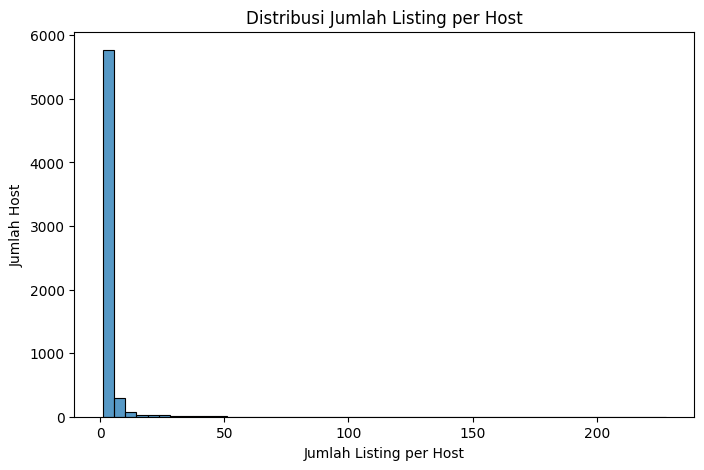

In [51]:
host_listing = df_filtered.groupby("host_id")["calculated_host_listings_count"].mean().reset_index()

# Distribusi jumlah listing per host
plt.figure(figsize=(8,5))
sns.histplot(data=host_listing, x="calculated_host_listings_count" ,bins=50, kde=False)
plt.title("Distribusi Jumlah Listing per Host")
plt.xlabel("Jumlah Listing per Host")
plt.ylabel("Jumlah Host")
plt.show()

In [52]:
host_listing["calculated_host_listings_count"].median()

np.float64(1.0)

In [53]:
host_listing["calculated_host_listings_count"].value_counts(normalize=True).head(5)

calculated_host_listings_count
1.0    0.683656
2.0    0.126857
3.0    0.054961
4.0    0.033072
5.0    0.023007
Name: proportion, dtype: float64

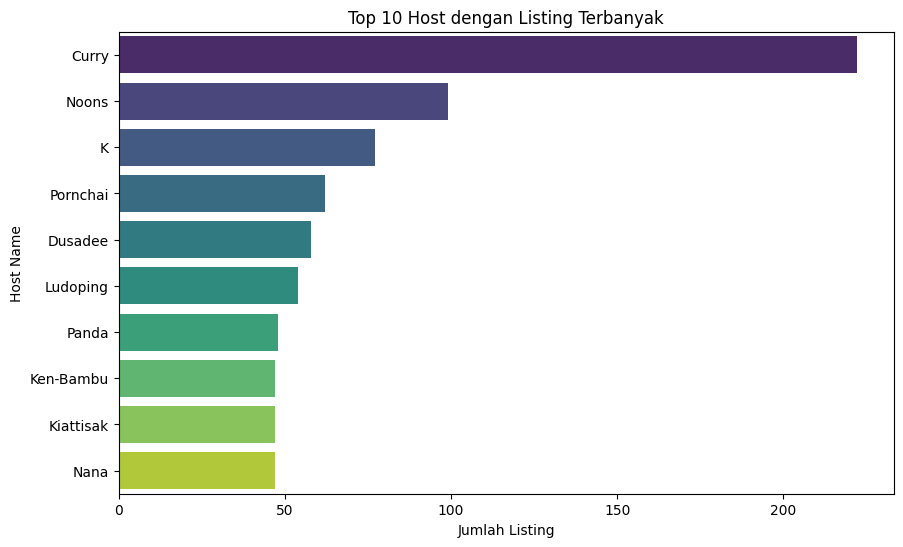

In [54]:
# Top 10 host dengan listing terbanyak
top_hosts = (df_filtered.groupby(['host_id', 'host_name'])
               .size()
               .reset_index(name='listing_count')
               .sort_values(by='listing_count', ascending=False)
               .head(10))

plt.figure(figsize=(10,6))
sns.barplot(data=top_hosts, x='listing_count', y='host_name', palette='viridis')
plt.title("Top 10 Host dengan Listing Terbanyak")
plt.xlabel("Jumlah Listing")
plt.ylabel("Host Name")
plt.show()


In [55]:
# Melihat market share dari Host "Curry"
df_filtered[df_filtered["host_name"] == "Curry"]["calculated_host_listings_count"].mean() / len(df) * 100

np.float64(1.4390305478414542)

**Insight :**

- Dari analisis distribusi data jumlah listing yang dimiliki host, sangat banyak host yang memiliki hanya 1 properti listing. Jika dihitung, terdapat 68% host yang memiliki 1 properti.

- Terdapat beberapa *Super Host* atau dapat dibilang orang yang memiliki properti listing sangat banyak. Host bernama **Curry** memiliki lebih dari 200 properti. Walaupun begitu, jika dihitung jumlah host ini hanya 1.4% dari jumlah host lainnya. Bisa diasumsikan market share host "Curry" ini tidak terlalu besar.

#### 4.5 Analisis durasi penyewaan properti

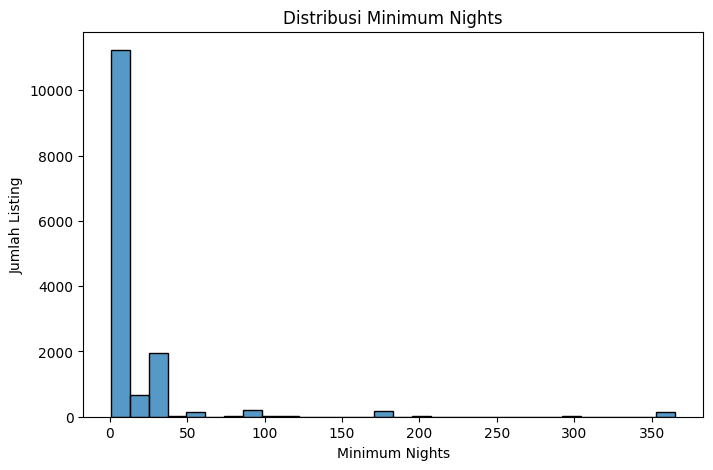

In [56]:
plt.figure(figsize=(8,5))
sns.histplot(df_filtered['minimum_nights'], bins=30)
plt.title("Distribusi Minimum Nights")
plt.xlabel("Minimum Nights")
plt.ylabel("Jumlah Listing")
plt.show()

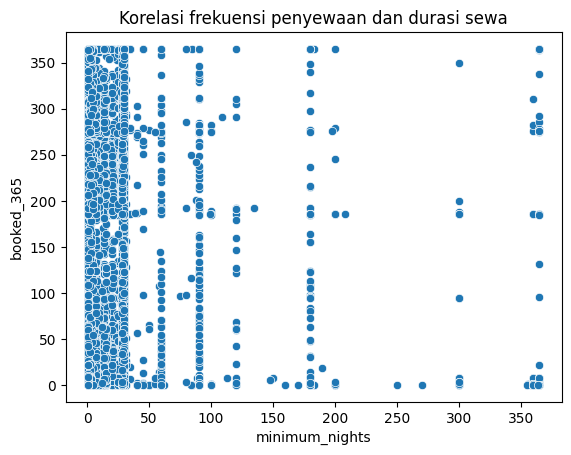

In [57]:
# Melihat korelasi antara minimum_nights dengan frekuensi sewa
sns.scatterplot(data=df_filtered,
                x="minimum_nights",
                y="booked_365")
plt.title("Korelasi frekuensi penyewaan dan durasi sewa")
plt.show()

In [58]:
df_filtered['minimum_nights'].corr(df_filtered['booked_365'], method='spearman')

np.float64(0.12626466830728253)

In [59]:
df_filtered["minimum_nights"].median()

np.float64(1.0)

In [60]:
df_filtered["minimum_nights"].quantile([0, 0.25, 0.5, 0.75, 1])

0.00      1.0
0.25      1.0
0.50      1.0
0.75      7.0
1.00    365.0
Name: minimum_nights, dtype: float64

Berdasarkan artikel yang saya dapatkan mengenai Airbnb, dikatakan bahwa lama sewa di atas 28 hari dapat dikategorikan long-term. Di sini akan diasumsikan jika menginap dalam waktu satu bulan (30 hari) maka dianggap penyewaan jangka panjang.

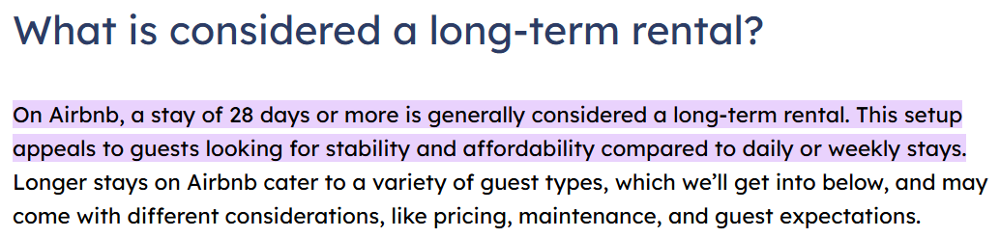

In [80]:
# membuat segmentasi penyewaan jangka pendek dan jangka panjang
df_filtered["rent_term"] = df_filtered["minimum_nights"].apply(lambda x: "Short" if x < 30 else "Long")
df_filtered["rent_term"].value_counts() / len(df_filtered) * 100

rent_term
Short    85.536908
Long     14.463092
Name: count, dtype: float64

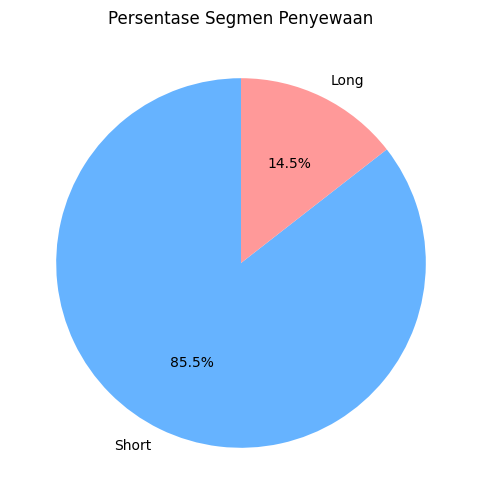

In [81]:
# Persentase segmen listing long dan short-term
# Hitung jumlah masing-masing segmen
rent_counts = df_filtered["rent_term"].value_counts()
percentages = rent_counts / len(df_filtered) * 100

# Buat pie plot
plt.figure(figsize=(6,6))
plt.pie(
    rent_counts,
    labels=rent_counts.index,
    autopct=lambda p: f'{p:.1f}%',
    startangle=90,
    colors=["#66b3ff", "#ff9999"]
)
plt.title("Persentase Segmen Penyewaan")
plt.show()

**Insight :**

- Berdasarkan analisis persebaran durasi penyewaan, para host lebih banyak menyewakan properti untuk jangka pendek dengan minimal penyewaan satu malam.

- Kemudian dilakukan segmentasi dengan jangka sewa termasuk pendek jika di bawah satu bulan dan jika lebih dari satu bulan termasuk jangka panjang. Dari segmentasi ini terlihat bahwa 86% listing menyewakan properti untuk jangka pendek.

- Pada analisis korelasi jangka waktu sewa dan frekuensi penyewaan, memang tidak terdapat korelasi secara langsung (nilai corr. mendekati 0). Walaupun begitu, berdasarka visualisasi scatter plot, didapatkan bahwa frekuensi sewa cenderung lebih banyak untuk jangka waktu penyewaan *Short-term*. Maka dapat dikatakan bahwa penyewaan jangka pendek lebih menguntungkan karena tingkat keterisian yang lebih tinggi.

### **5. Conclusion and Recommendation**

#### 5.1 Conclusion

Dari hasil analisis data listing yang telah dilakukan, terdapat berbagai informasi yang diperoleh, yaitu :

**1. Lokasi dengan Properti Listing Terbanyak**

Daerah Vadhana dan Khlong Toei merupakan daerah dengan jumlah properti listing terbanyak. Kedua lokasi ini juga paling memiliki jumlah keterisian listing tertinggi. Kemungkinan besar daerah ini dekat dengan pusat kota, perbelanjaan, dan wisata di Bangkok sehingga banyak wisatawan yang memilih untuk menginap di sekitar daerah ini.

**2. Harga Sewa berdasarkan Lokasi dan Jenis Listing**

Dalam batasan harga sewa maksimal 5 ribu BHT, tipe properti *Shared Room* memiliki harga sewa terendah dengan kisaran 500 BHT per-malam. Tipe *Private Room* memiliki kisaran harga 1.200 BHT, sedangkan untuk tipe *Hotel Room* dan *Entire Home/Apt* memiliki kisaran harga 1.500 BHT per-malam.

Daerah yang berdekatan dengan pusat kota, seperti *Parthum Wan, Bang Rak, Vadhana, dan Khlong Toei* memiliki kisaran harga tertinggi di antara daerah lainnya. Tentu ini sangat memungkinkan karena daerah ini sangat dekat dengan pusat wisata si Bangkok.

**3. Keuntungan dan Frekuensi Penyewaan per-Tahun**

Dari hasil analisis, tingkat keterisian properti listing dalam setahun adalah sebesar 59 hari dengan tipe room *Entire Home/Apt* yang paling sering disewa. Jika dihitung jumlah omzet dengan mengalikan keterisian listing dengan harga sewa, didapatkan kisaran pendapatan kotor sebesar 76 ribu Baht dalam setahun untuk satu properti listing. (Catatan : kisaran harga listing di bawah 5 ribu Baht)

**4. Peluang Host Baru**

Dari hasil analisis, terdapat 69% host yang hanya memiliki 1 properti listing. Walaupun begitu, terdapat host yang memiliki hingga 200 properti.

**5. Durasi Penyewaan Properti**

Sebanyak 86% listing disewakan dalam jangka waktu pendek. Ditemukan juga bahwa keterisian pada listing yang disewakan jangka pendek lebih banyak daripada yang jangka panjang.

##### *Summary*
- Daerah yang berdekatan dengan pusat kota, perbelanjaan, dan wisata sudah memiliki banyak properti listing. Namun, di daerah ini juga memiliki potensi penyewaan yang tinggi.

- Semakin posisi properti dekat dengan pusat kota, maka harga sewa dapat semakin tinggi.

- Dalam usaha properti listing, terdapat kemungkinan bahwa properti tidak terisi secara penuh sepanjang hari dalam satu tahun.

- Jika diasumsikan bahwa host yang memiliki 1 properti bukan merupakan professional host, maka terdapat peluang besar bagi investor untuk menjadi host listing, karena market share tidak dikuasai oleh satu atau sekelompok host tertentu.

- Customer/Penyewa listing dapat dikatakan lebih menyukai penyewaan jangka pendek. Hal ini dapat diasumsikan karena mayoritas tujuan penyewa ke Kota Bangkok adalah untuk berwisata.

#### 5.2 Recommendation

Dari kesimpulan *insight* yang telah didapatkan dari analisis, selanjutnya akan diberikan rekomendasi strategi bagi pada *stakeholder* (investor properti dan calon host).

| Aspek                          | Rekomendasi                                                                                                                                                       |
|--------------------------------|-------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **1. Pemilihan Lokasi**        | - Pilih lokasi strategis dekat pusat kota, perbelanjaan, dan wisata (contoh: Vadhana, Khlong Toei). <br> - Jika memilih lokasi ramai, berikan *value* lebih (desain menarik, amenities lengkap). |
| **2. Penentuan Harga**         | - Sesuaikan harga dengan rata-rata harga di area sekitar. <br> - Untuk bersaing di lokasi mahal, gunakan strategi *competitive pricing* (sedikit di bawah rata-rata). <br> - Berikan diskon untuk long-stay atau pemesanan awal (*early bird*). |
| **3. Strategi Tingkat Keterisian** | - Terapkan *dynamic pricing* sesuai musim, hari libur, dan permintaan. <br> - Optimalkan deskripsi dan foto di platform agar menarik. <br> - Berikan promo atau potongan harga di musim sepi. |
| **4. Persaingan antar Host**   | - Bangun *brand image* dengan konsistensi layanan (review positif, komunikasi cepat). <br> - Tambahkan layanan ekstra: sarapan gratis, rekomendasi lokal, *self check-in*. <br> - Diferensiasi properti (tema unik, interior aesthetic). |
| **5. Durasi Penyewaan**        | - Fokus pada penyewaan jangka pendek karena lebih diminati wisatawan. <br> - Sediakan opsi fleksibel (mingguan/bulanan) untuk menjangkau digital nomad atau remote worker. |


### **Appendix**

#### *Export clean dataset*

In [63]:
df_filtered.head()

,listing_id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,booked_365,revenue,rent_term
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0,12,22860,Short
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaT,0.00,2,358,0,7,9212,Short
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaT,0.00,1,365,0,0,0,Long
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1,42,54012,Short
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaT,0.00,3,365,0,0,0,Short


In [64]:
#df_filtered.to_csv("Cleaned_Airbnb Listings Bangkok.csv", index=False)

In [65]:
df_filtered.shape

(14658, 19)

#### *References*

Sumber Geojson Kota Bangkok :
[kaggle_link](https://www.kaggle.com/datasets/soeltanpasja/bangkok-districts?resource=download)

Sumber Artikel Informasi Airbnb :
[airbnb article](https://www.breezeway.io/blog/airbnb-long-term-rentals#:~:text=On%20Airbnb%2C%20a%20stay%20of,to%20daily%20or%20weekly%20stays.)